In [1]:
import numpy as np
from scipy.stats import chi2
from scipy.stats import mannwhitneyu
from statsmodels.stats import multitest as multi
import pandas as pd
import scanpy as sc
import anndata as ad
import scanpy.external as sce
import decoupler as dc
# import scrublet as scr
# import muon as mu
#from vpolo.alevin import parser # to parse alevin output
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
import statsmodels.stats.multitest as multi

import re

seed = 0
np.random.seed(seed)
%matplotlib inline

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

In [2]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
# sc.settings.set_figure_params(dpi=80, color_map='viridis', transparent=False, frameon=False)  # low dpi (dots per inch) yields small inline figures

import matplotlib as mpl
# 2 lines below solved the facecolor problem.
# mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
sc.settings.autosave = True
sc.logging.print_header()

version = '241127_cpdb'
# input_table = '../data/231009_PBMC_HH514.csv'

results_file = '/home/yy693/pi_hafler/ASAP/scanpy/241028_CSF_downstream/res.cxg.h5ad'

import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)

sc.settings.figdir = '../scanpy/{}/graph'.format(version)
sc.settings.cachedir = '../scanpy/{}/cache'.format(version)
# %config InlineBackend.figure_format = 'retina'

import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)
os.makedirs(sc.settings.figdir, exist_ok=True)

2025-03-06 11:30:30.311742: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-06 11:30:30.325753: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-06 11:30:30.340365: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-06 11:30:30.344526: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-06 11:30:30.357127: I tensorflow/core/platform/cpu_feature_guar

scanpy==1.10.2 anndata==0.10.9 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==2.0.3 scikit-learn==1.5.1 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


In [3]:
import ktplotspy as kpy
from cellphonedb.src.core.methods import cpdb_statistical_analysis_method

In [4]:
adata = sc.read(results_file)

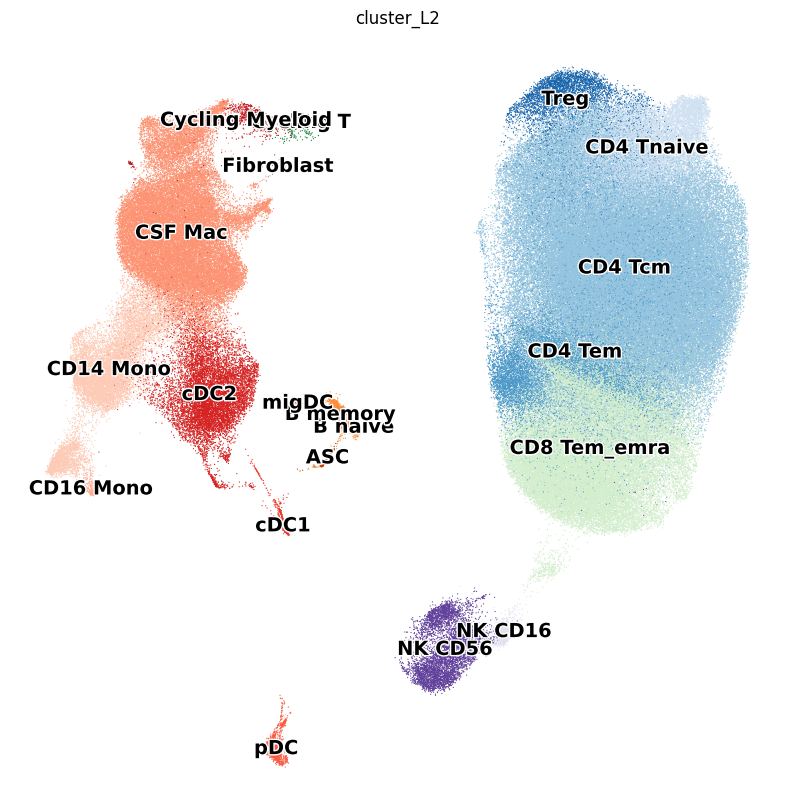

In [5]:
with plt.rc_context({"figure.figsize": (10, 10)}):
    sc.pl.embedding(
        adata,
        basis="umap_filtered",
        s=3,
        color="cluster_L2",
        legend_loc="on data",
        legend_fontsize=14,
        legend_fontoutline=2,
        frameon=False,
        # add_outline=True,
        # outline_width=(0.1, 5),
        # palette=cluster_palette,
        save='filter_reembed_cluster_L2_color_gradation.pdf'
    )

In [5]:
list_celltypes_retain = list(adata.obs['cluster_L2'].value_counts()[adata.obs['cluster_L2'].value_counts() > 500].index)

In [6]:
adata = adata[adata.obs.cluster_L2.isin(list_celltypes_retain)]
adata.obs['cluster_L2'] = adata.obs['cluster_L2'].astype('str')

In [12]:
adata.obs['cluster_L2'].to_csv('../scanpy/{}/cluster_L2.txt'.format(version), sep='\t', header=False)

In [33]:
adata.write('../scanpy/{}/res.n500.cxg.h5ad'.format(version))

In [34]:
cpdb_results = cpdb_statistical_analysis_method.call(
         cpdb_file_path = '../data/cellphonedb.zip',
         meta_file_path = '../scanpy/{}/cluster_L2.txt'.format(version),
         counts_file_path = '../scanpy/{}/res.n500.cxg.h5ad'.format(version),
         counts_data = 'hgnc_symbol',
         output_path = f'../scanpy/{version}')

Reading user files...


The following user files were loaded successfully:
../scanpy/241127_cpdb/res.n500.cxg.h5ad
../scanpy/241127_cpdb/cluster_L2.txt
[ ][CORE][05/12/24-14:39:40][INFO] [Cluster Statistical Analysis] Threshold:0.1 Iterations:1000 Debug-seed:-1 Threads:4 Precision:3
[ ][CORE][05/12/24-14:39:46][INFO] Running Real Analysis
[ ][CORE][05/12/24-14:39:46][INFO] Running Statistical Analysis


100%|██████████| 1000/1000 [24:08<00:00,  1.45s/it]

[ ][CORE][05/12/24-15:03:56][INFO] Building Pvalues result


[ ][CORE][05/12/24-15:03:56][INFO] Building results
Saved deconvoluted to ../scanpy/241127_cpdb/statistical_analysis_deconvoluted_12_05_2024_150356.txt
Saved deconvoluted_percents to ../scanpy/241127_cpdb/statistical_analysis_deconvoluted_percents_12_05_2024_150356.txt
Saved means to ../scanpy/241127_cpdb/statistical_analysis_means_12_05_2024_150356.txt
Saved pvalues to ../scanpy/241127_cpdb/statistical_analysis_pvalues_12_05_2024_150356.txt
Saved significant_means to ../scanpy/241127_cpdb/statistical_analysis_significant_means_12_05_2024_150356.txt


In [7]:
means = pd.read_csv('/home/yy693/pi_hafler/ASAP/scanpy/241127_cpdb/statistical_analysis_means_12_05_2024_150356.txt', sep="\t")
pvals = pd.read_csv('/home/yy693/pi_hafler/ASAP/scanpy/241127_cpdb/statistical_analysis_pvalues_12_05_2024_150356.txt', sep="\t")
decon = pd.read_csv('/home/yy693/pi_hafler/ASAP/scanpy/241127_cpdb/statistical_analysis_deconvoluted_12_05_2024_150356.txt', sep="\t")

In [13]:
means.head()

,id_cp_interaction,interacting_pair,partner_a,partner_b,gene_a,gene_b,secreted,receptor_a,receptor_b,annotation_strategy,...,pDC|CD4 Tnaive,pDC|CD8 Tem_emra,pDC|CSF Mac,pDC|Cycling Myeloid,pDC|NK CD16,pDC|NK CD56,pDC|Treg,pDC|cDC1,pDC|cDC2,pDC|pDC
0,CPI-SC0A2DB962D,CDH1_integrin_a2b1_complex,simple:P12830,complex:integrin_a2b1_complex,CDH1,NaN,False,False,False,curated,...,0.013,0.013,0.010,0.010,0.0,0.010,0.011,0.010,0.010,0.010
1,CPI-SC0B5CEA47D,COL10A1_integrin_a2b1_complex,simple:Q03692,complex:integrin_a2b1_complex,COL10A1,NaN,True,False,False,curated,...,0.006,0.007,0.003,0.003,0.0,0.004,0.005,0.003,0.003,0.004
2,CPI-SC0C8B7BCBB,COL11A1_integrin_a2b1_complex,simple:P12107,complex:integrin_a2b1_complex,COL11A1,NaN,True,False,False,curated,...,0.004,0.005,0.001,0.001,0.0,0.002,0.003,0.001,0.001,0.001
3,CPI-SC0D3C12C3F,COL11A2_integrin_a2b1_complex,simple:P13942,complex:integrin_a2b1_complex,COL11A2,NaN,True,False,False,curated,...,0.004,0.004,0.001,0.001,0.0,0.001,0.002,0.001,0.001,0.001
4,CPI-SC0FA343CEF,COL13A1_integrin_a2b1_complex,simple:Q5TAT6,complex:integrin_a2b1_complex,COL13A1,NaN,False,False,False,curated,...,0.000,0.000,0.000,0.000,0.0,0.000,0.000,0.000,0.000,0.000


In [14]:
pvals.head()

,id_cp_interaction,interacting_pair,partner_a,partner_b,gene_a,gene_b,secreted,receptor_a,receptor_b,annotation_strategy,...,pDC|CD4 Tnaive,pDC|CD8 Tem_emra,pDC|CSF Mac,pDC|Cycling Myeloid,pDC|NK CD16,pDC|NK CD56,pDC|Treg,pDC|cDC1,pDC|cDC2,pDC|pDC
0,CPI-SC0A2DB962D,CDH1_integrin_a2b1_complex,simple:P12830,complex:integrin_a2b1_complex,CDH1,NaN,False,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,CPI-SC0B5CEA47D,COL10A1_integrin_a2b1_complex,simple:Q03692,complex:integrin_a2b1_complex,COL10A1,NaN,True,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,CPI-SC0C8B7BCBB,COL11A1_integrin_a2b1_complex,simple:P12107,complex:integrin_a2b1_complex,COL11A1,NaN,True,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,CPI-SC0D3C12C3F,COL11A2_integrin_a2b1_complex,simple:P13942,complex:integrin_a2b1_complex,COL11A2,NaN,True,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,CPI-SC0FA343CEF,COL13A1_integrin_a2b1_complex,simple:Q5TAT6,complex:integrin_a2b1_complex,COL13A1,NaN,False,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [15]:
decon.head()

,gene_name,uniprot,is_complex,protein_name,complex_name,id_cp_interaction,gene,B memory,CD14 Mono,CD4 Tcm,...,CD4 Tnaive,CD8 Tem_emra,CSF Mac,Cycling Myeloid,NK CD16,NK CD56,Treg,cDC1,cDC2,pDC
0,UBASH3B,Q8TF42,True,UBS3B_HUMAN,Dehydroepiandrosterone_bySTS,CPI-CS09B8977D7,UBASH3B,0.018,0.149,0.112,...,0.155,0.072,0.171,0.117,0.068,0.169,0.210,0.246,0.235,0.011
1,UBASH3B,Q8TF42,True,UBS3B_HUMAN,Dehydroepiandrosterone_bySTS,CPI-CS05760BB78,UBASH3B,0.018,0.149,0.112,...,0.155,0.072,0.171,0.117,0.068,0.169,0.210,0.246,0.235,0.011
2,UBASH3B,Q8TF42,True,UBS3B_HUMAN,Dehydroepiandrosterone_bySTS,CPI-CS0259A0EB4,UBASH3B,0.018,0.149,0.112,...,0.155,0.072,0.171,0.117,0.068,0.169,0.210,0.246,0.235,0.011
3,SULT1A1,P50225,True,ST1A1_HUMAN,DHEAsulfate_bySULT2B,CPI-CS099F73A95,SULT1A1,0.007,0.284,0.012,...,0.015,0.013,0.130,0.097,0.011,0.023,0.011,0.039,0.063,0.027
4,SULT1A1,P50225,True,ST1A1_HUMAN,DHEAsulfate_bySULT2B,CPI-CS0D89E7C19,SULT1A1,0.007,0.284,0.012,...,0.015,0.013,0.130,0.097,0.011,0.023,0.011,0.039,0.063,0.027


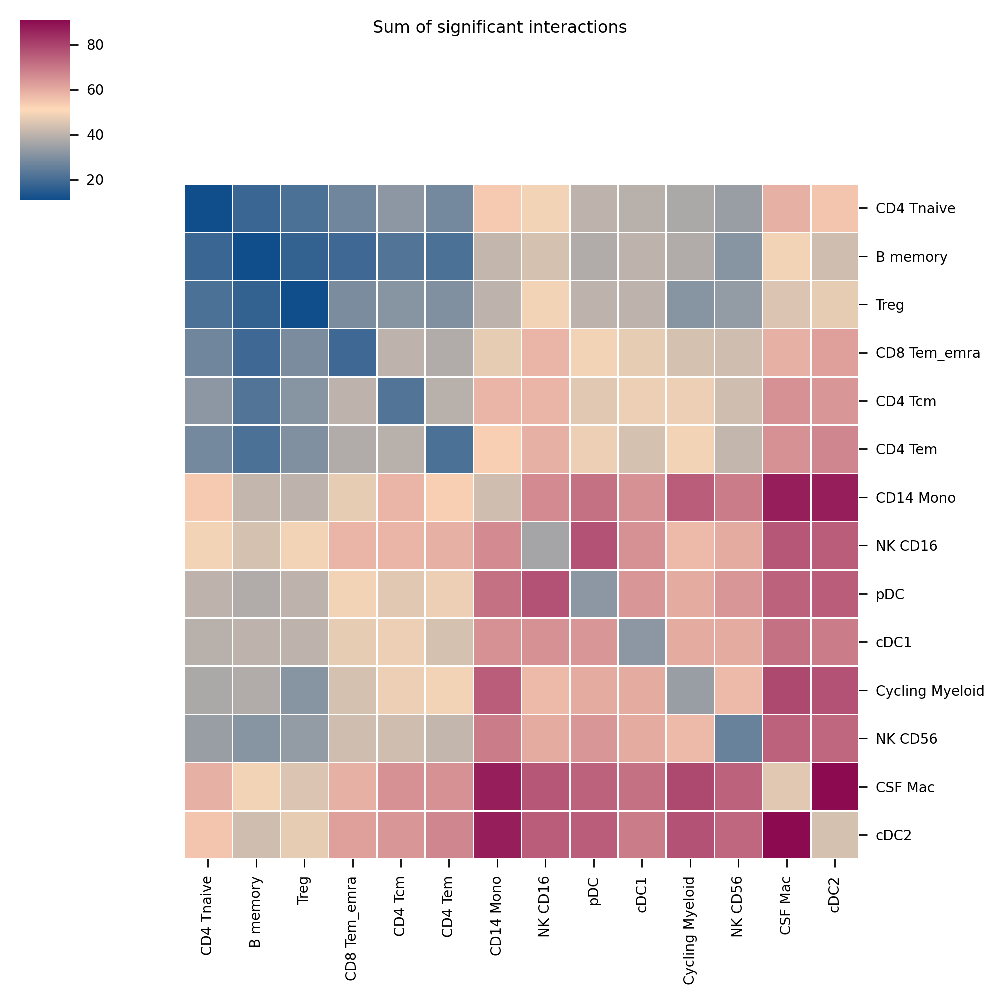

In [16]:
kpy.plot_cpdb_heatmap(pvals=pvals, figsize=(10, 10), title="Sum of significant interactions")
plt.savefig('../scanpy/{}/graph/cpdb_heatmap.pdf'.format(version))

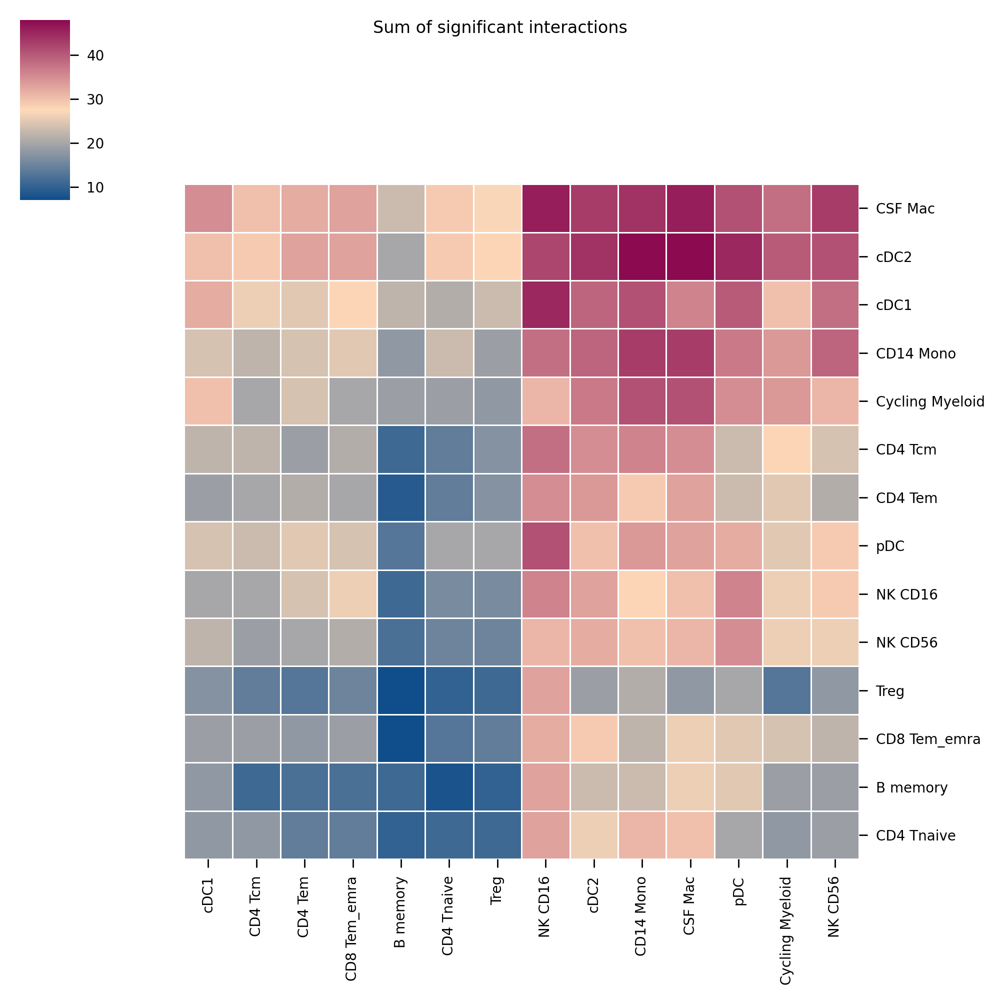

In [17]:
kpy.plot_cpdb_heatmap(pvals=pvals, figsize=(10, 10), title="Sum of significant interactions", symmetrical=False,
)
plt.savefig('../scanpy/{}/graph/cpdb_heatmap_asymmetric.pdf'.format(version))

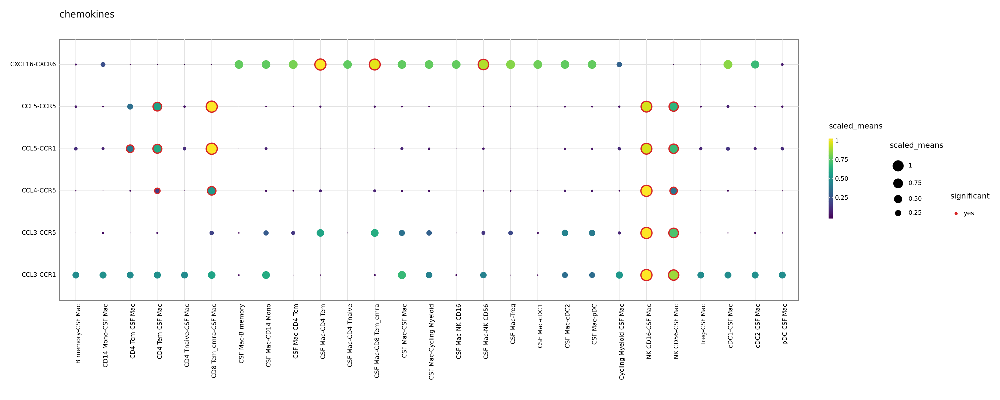

<Figure Size: (2000 x 800)>

In [18]:
kpy.plot_cpdb(
    adata=adata,
    cell_type1="CSF Mac",
    cell_type2=".",
    means=means,
    pvals=pvals,
    celltype_key="cluster_L2",
    gene_family="chemokines",
    highlight_size=1,
    figsize=(20, 8),
)

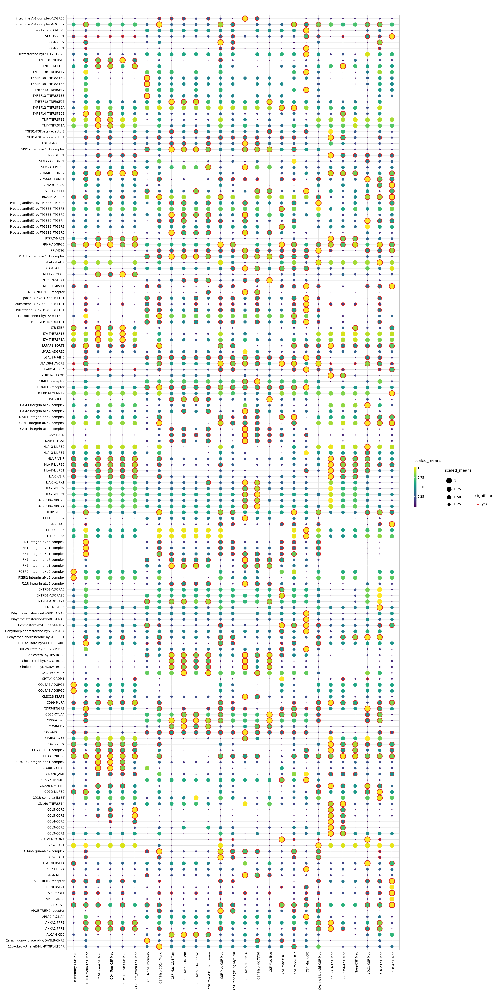

<Figure Size: (2000 x 4000)>

In [19]:
kpy.plot_cpdb(
    adata=adata,
    cell_type1="CSF Mac",
    cell_type2=".",
    means=means,
    pvals=pvals,
    celltype_key="cluster_L2",
    # gene_family="chemokines",
    highlight_size=1,
    figsize=(20, 40),
)

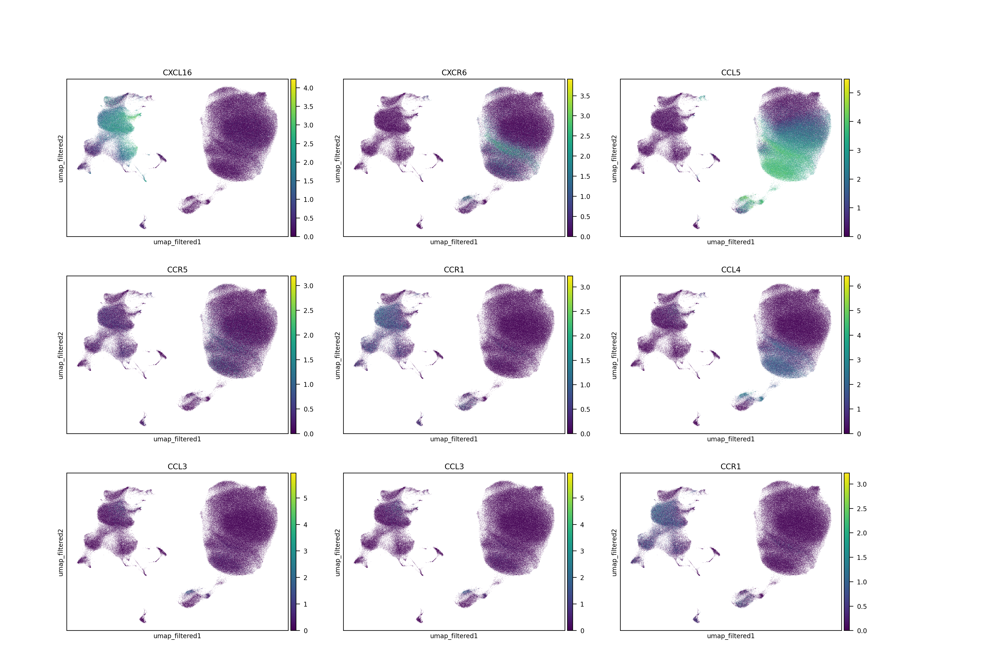

In [20]:
sc.pl.embedding(adata, color=['CXCL16', 'CXCR6', 'CCL5', 'CCR5', 'CCR1', 'CCL4', 'CCL3', 'CCL3', 'CCR1'],
                basis='umap_filtered', ncols=3, save=False)

In [44]:
pvals

,id_cp_interaction,interacting_pair,partner_a,partner_b,gene_a,gene_b,secreted,receptor_a,receptor_b,annotation_strategy,...,pDC|Cycling Myeloid,pDC|Cycling T,pDC|Fibroblast,pDC|NK CD16,pDC|NK CD56,pDC|Treg,pDC|cDC1,pDC|cDC2,pDC|migDC,pDC|pDC
0,CPI-SC0A2DB962D,CDH1_integrin_a2b1_complex,simple:P12830,complex:integrin_a2b1_complex,CDH1,NaN,False,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,CPI-SC0B5CEA47D,COL10A1_integrin_a2b1_complex,simple:Q03692,complex:integrin_a2b1_complex,COL10A1,NaN,True,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,CPI-SC0C8B7BCBB,COL11A1_integrin_a2b1_complex,simple:P12107,complex:integrin_a2b1_complex,COL11A1,NaN,True,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,CPI-SC0D3C12C3F,COL11A2_integrin_a2b1_complex,simple:P13942,complex:integrin_a2b1_complex,COL11A2,NaN,True,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,CPI-SC0FA343CEF,COL13A1_integrin_a2b1_complex,simple:Q5TAT6,complex:integrin_a2b1_complex,COL13A1,NaN,False,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1409,CPI-SS0F9F83827,PTPRD_IL1RAPL1,simple:P23468,simple:Q9NZN1,PTPRD,IL1RAPL1,False,True,True,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1410,CPI-SS0BC884A75,QRFP_QRFPR,simple:P83859,simple:Q96P65,QRFP,QRFPR,True,False,True,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1411,CPI-SS016FD0C8A,RNASET2_TLR8,simple:O00584,simple:Q9NR97,RNASET2,TLR8,True,False,True,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1412,CPI-SS07D508428,SIGLEC15_CD44,simple:Q6ZMC9,simple:P16070,SIGLEC15,CD44,False,False,True,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [45]:
pvals

,id_cp_interaction,interacting_pair,partner_a,partner_b,gene_a,gene_b,secreted,receptor_a,receptor_b,annotation_strategy,...,pDC|Cycling Myeloid,pDC|Cycling T,pDC|Fibroblast,pDC|NK CD16,pDC|NK CD56,pDC|Treg,pDC|cDC1,pDC|cDC2,pDC|migDC,pDC|pDC
0,CPI-SC0A2DB962D,CDH1_integrin_a2b1_complex,simple:P12830,complex:integrin_a2b1_complex,CDH1,NaN,False,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,CPI-SC0B5CEA47D,COL10A1_integrin_a2b1_complex,simple:Q03692,complex:integrin_a2b1_complex,COL10A1,NaN,True,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,CPI-SC0C8B7BCBB,COL11A1_integrin_a2b1_complex,simple:P12107,complex:integrin_a2b1_complex,COL11A1,NaN,True,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,CPI-SC0D3C12C3F,COL11A2_integrin_a2b1_complex,simple:P13942,complex:integrin_a2b1_complex,COL11A2,NaN,True,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
4,CPI-SC0FA343CEF,COL13A1_integrin_a2b1_complex,simple:Q5TAT6,complex:integrin_a2b1_complex,COL13A1,NaN,False,False,False,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1409,CPI-SS0F9F83827,PTPRD_IL1RAPL1,simple:P23468,simple:Q9NZN1,PTPRD,IL1RAPL1,False,True,True,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1410,CPI-SS0BC884A75,QRFP_QRFPR,simple:P83859,simple:Q96P65,QRFP,QRFPR,True,False,True,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1411,CPI-SS016FD0C8A,RNASET2_TLR8,simple:O00584,simple:Q9NR97,RNASET2,TLR8,True,False,True,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1412,CPI-SS07D508428,SIGLEC15_CD44,simple:Q6ZMC9,simple:P16070,SIGLEC15,CD44,False,False,True,curated,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [8]:
th_alpha = 0.05
th_mean = 0.1
# category_comp = 'Diagnosis_RBDstrat'
category_comp = 'EnrollmentCategory'
cat_ref = 'HC'
# cat_oi = 'RBD_Hyposmia_neg'
cat_oi = 'RBD'

In [9]:
list_all_gene = list(set(list(means['gene_a'].dropna()) + list(means['gene_b'].dropna())))
pairs = list(pvals.columns)[13:]

list_d_FC = []
list_d_mean = []
for clu in list(adata.obs['cluster_L2'].unique()):
    d_FC = pd.DataFrame(
        np.expm1(adata[(adata.obs[category_comp] == cat_oi)&(adata.obs['cluster_L2']==clu)].X.mean(axis=0)) / \
            np.expm1(adata[(adata.obs[category_comp] == cat_ref)&(adata.obs['cluster_L2']==clu)].X.mean(axis=0)),
            columns=adata.var.index, index=[clu]).T
    d_mean = pd.DataFrame(
        adata[adata.obs['cluster_L2']==clu].X.mean(axis=0),
            columns=adata.var.index, index=[clu]).T
    list_d_FC.append(d_FC)
    list_d_mean.append(d_mean)

df_FC = pd.concat(list_d_FC, axis=1)
df_mean = pd.concat(list_d_mean, axis=1)

# df_FC = df_FC.loc[list_all_gene]
# df_mean = df_mean.loc[list_all_gene]

/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/1865804604.py:8: RuntimeWarning: divide by zero enco

In [ ]:
list_result = []
for pair in pairs:
    print(pair)
    list_gene_a = list(set(pvals.loc[pvals[pair] < th_alpha, 'gene_a'].dropna()))
    list_gene_b = list(set(pvals.loc[pvals[pair] < th_alpha, 'gene_b'].dropna()))
    ser_FC_oi_a = df_FC.loc[df_mean[pair.split('|')[0]] > th_mean, pair.split('|')[0]].dropna()
    ser_FC_oi_b = df_FC.loc[df_mean[pair.split('|')[1]] > th_mean, pair.split('|')[1]].dropna()
    ser_FC_oi_a = ser_FC_oi_a[ser_FC_oi_a != np.inf]
    ser_FC_oi_b = ser_FC_oi_b[ser_FC_oi_b != np.inf]
    ser_FC_oi_a = ser_FC_oi_a[ser_FC_oi_a != 0]
    ser_FC_oi_b = ser_FC_oi_b[ser_FC_oi_b != 0]
    ser_FC_oi_a_per = ser_FC_oi_a.rank(ascending=False) / ser_FC_oi_a.shape[0]
    ser_FC_oi_b_per = ser_FC_oi_b.rank(ascending=False) / ser_FC_oi_b.shape[0]

    list_obs_p = list(ser_FC_oi_a_per.loc[[x for x in list_gene_a if x in ser_FC_oi_a_per.index]]) +\
        list(ser_FC_oi_b_per.loc[[x for x in list_gene_b if x in ser_FC_oi_b_per.index]])
    Q = np.prod(list_obs_p)
    T = -np.log(Q)
    df = len(list_obs_p)
    p_value = chi2.sf(T, df)
    # print(f"Observed T: {T}")
    # print(f"P(T >= {T}): {p_value}")

    # perform mann whitney U test
    if len([x for x in list_gene_a if x in ser_FC_oi_a_per.index]) > 0:
        U1, p_a = mannwhitneyu(list(ser_FC_oi_a_per.loc[[x for x in list_gene_a if x in ser_FC_oi_a_per.index]]), 
            list(ser_FC_oi_a_per.loc[[x for x in ser_FC_oi_a_per.index if x not in list_gene_a]]), method="auto")
        sc.pl.dotplot(adata[adata.obs['cluster_L2']==pair.split('|')[1]], list_gene_a, groupby=category_comp, 
        standard_scale='var', cmap='seismic', save=f'pair_{pair}_a.pdf', show=False)
    else:
        p_a = 1
    print('Pair A: ', p_a)

    if len([x for x in list_gene_b if x in ser_FC_oi_b_per.index]) > 0:
        U1, p_b = mannwhitneyu(list(ser_FC_oi_b_per.loc[[x for x in list_gene_b if x in ser_FC_oi_b_per.index]]), 
        list(ser_FC_oi_b_per.loc[[x for x in ser_FC_oi_b_per.index if x not in list_gene_b]]), method="auto")
        sc.pl.dotplot(adata[adata.obs['cluster_L2']==pair.split('|')[0]], list_gene_b, groupby=category_comp,
        standard_scale='var', cmap='seismic', save=f'pair_{pair}_b.pdf', show=False)
    else:
        p_b = 1
    print('Pair B: ', p_b)
    list_result.append([
        p_a, p_b,
        ser_FC_oi_a.loc[[x for x in list_gene_a if x in ser_FC_oi_a.index]].mean(),
        ser_FC_oi_b.loc[[x for x in list_gene_b if x in ser_FC_oi_b.index]].mean()])

    
df_result = pd.DataFrame(list_result, columns=['p_a', 'p_b', 'mean_a', 'mean_b'], index=pairs)
# calculate FDR
df_result['padj_a'] = multi.multipletests(df_result['p_a'], method='fdr_bh')[1]
df_result['padj_b'] = multi.multipletests(df_result['p_b'], method='fdr_bh')[1]

df_result['source'] = df_result.index.str.split('|').str[0]
df_result['target'] = df_result.index.str.split('|').str[1]

df_result.to_csv('../scanpy/{}/LFC_cat_{}_{}_result.txt'.format(version, category_comp, cat_oi), sep='\t')

B memory|B memory


Pair A:  0.03899141969459586
Pair B:  0.7768780361998349
B memory|CD14 Mono
Pair A:  0.48497875101855004
Pair B:  0.22595447258826207
B memory|CD4 Tcm
Pair A:  0.0016347479372157544
Pair B:  0.3219195362536672
B memory|CD4 Tem
Pair A:  0.006265410341456107
Pair B:  0.09025292295979842
B memory|CD4 Tnaive
Pair A:  0.024677390013707272
Pair B:  0.11754212747481557
B memory|CD8 Tem_emra
Pair A:  0.03837922088806721
Pair B:  0.31483555931040563
B memory|CSF Mac
Pair A:  0.23854793141113284
Pair B:  0.5337628945302793
B memory|Cycling Myeloid
Pair A:  0.19708665068107611
Pair B:  0.9414788786220786
B memory|NK CD16
Pair A:  0.6691401396199536
Pair B:  0.34529260410292983
B memory|NK CD56
Pair A:  0.22438676465929897
Pair B:  0.49904445327200475
B memory|Treg
Pair A:  0.09504769254431708
Pair B:  0.14758783824767185
B memory|cDC1
Pair A:  0.11547281036753589
Pair B:  0.4128736811636401
B memory|cDC2
Pair A:  0.5237203727110187
Pair B:  0.32247140303066657
B memory|pDC
Pair A:  0.456495977703

In [14]:
df_result.sort_values(by='padj_a').head(20)

,p_a,p_b,mean_a,mean_b,padj_a,padj_b
NK CD16|NK CD16,0.002923,0.148884,1.021337,1.355924,0.186909,0.550588
CD4 Tcm|CD4 Tem,0.004768,0.132222,0.916429,1.027242,0.186909,0.508147
CD4 Tcm|CD8 Tem_emra,0.003882,0.105404,0.915909,1.031549,0.186909,0.490682
NK CD16|pDC,0.004147,0.811389,1.098119,1.031460,0.186909,0.882426
B memory|CD4 Tcm,0.001635,0.321920,1.429482,1.048022,0.186909,0.636025
B memory|CD4 Tem,0.006265,0.090253,1.352149,1.044413,0.204670,0.490682
CD14 Mono|pDC,0.026699,0.469089,0.924282,1.079014,0.284783,0.681048
Cycling Myeloid|Cycling Myeloid,0.027606,0.125174,1.039092,1.358405,0.284783,0.490682
CD4 Tcm|Cycling Myeloid,0.019037,0.441727,0.946343,1.282264,0.284783,0.659093
CD4 Tcm|pDC,0.019708,0.347218,0.944651,1.011333,0.284783,0.636025


In [15]:
df_result.sort_values(by='padj_b').head(20)

,p_a,p_b,mean_a,mean_b,padj_a,padj_b
CD14 Mono|cDC2,0.135304,0.000222,0.945498,1.132992,0.491105,0.043552
CSF Mac|cDC2,0.177318,0.000717,1.097944,1.133340,0.581380,0.049150
Cycling Myeloid|cDC2,0.023239,0.001003,1.031232,1.126175,0.284783,0.049150
cDC2|cDC2,0.476948,0.000881,1.006037,1.114776,0.805558,0.049150
NK CD56|cDC2,0.971616,0.004205,1.070421,1.102656,0.995027,0.103024
NK CD16|cDC2,0.195444,0.003294,1.196575,1.102027,0.584815,0.103024
Cycling Myeloid|CSF Mac,0.154580,0.003637,1.083357,1.238389,0.531537,0.103024
cDC2|CSF Mac,0.525214,0.004136,1.011144,1.230325,0.831956,0.103024
CSF Mac|CSF Mac,0.170028,0.006134,1.107261,1.233271,0.574579,0.133576
CD4 Tem|CD8 Tem_emra,0.081752,0.007181,0.947485,1.058314,0.426815,0.140742


In [20]:
df_result['source'] = df_result.index.str.split('|').str[0]
df_result['target'] = df_result.index.str.split('|').str[1]

In [21]:
df_result.to_csv('../scanpy/{}/LFC_cat_{}_{}_result.txt'.format(version, category_comp, cat_oi), sep='\t')

In [10]:
# pair = 'CD4 Tem|ASC'
pair = 'CSF Mac|CSF Mac'
list_gene_a = list(set(pvals.loc[pvals[pair] < th_alpha, 'gene_a'].dropna()))
list_gene_b = list(set(pvals.loc[pvals[pair] < th_alpha, 'gene_b'].dropna()))
ser_FC_oi_a = df_FC.loc[df_mean[pair.split('|')[0]] > th_mean, pair.split('|')[0]].dropna()
ser_FC_oi_b = df_FC.loc[df_mean[pair.split('|')[1]] > th_mean, pair.split('|')[1]].dropna()
ser_FC_oi_a = ser_FC_oi_a[ser_FC_oi_a != np.inf]
ser_FC_oi_b = ser_FC_oi_b[ser_FC_oi_b != np.inf]
ser_FC_oi_a = ser_FC_oi_a[ser_FC_oi_a != 0]
ser_FC_oi_b = ser_FC_oi_b[ser_FC_oi_b != 0]
ser_FC_oi_a_per = ser_FC_oi_a.rank(ascending=False) / ser_FC_oi_a.shape[0]
ser_FC_oi_b_per = ser_FC_oi_b.rank(ascending=False) / ser_FC_oi_b.shape[0]


In [37]:
pvals.loc[pvals[pair] < th_alpha]

,id_cp_interaction,interacting_pair,partner_a,partner_b,gene_a,gene_b,secreted,receptor_a,receptor_b,annotation_strategy,...,pDC|CD4 Tnaive,pDC|CD8 Tem_emra,pDC|CSF Mac,pDC|Cycling Myeloid,pDC|NK CD16,pDC|NK CD56,pDC|Treg,pDC|cDC1,pDC|cDC2,pDC|pDC
42,CPI-SS0889E281D,CADM1_CADM1,simple:Q9BY67,simple:Q9BY67,CADM1,CADM1,False,False,False,curated,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
166,CPI-SS0087B834D,PRNP_ADGRG6,simple:F7VJQ1,simple:Q86SQ4,PRNP,ADGRG6,False,False,True,curated,...,1.000,1.000,0.000,0.960,1.000,1.000,1.000,0.000,0.996,1.000
187,CPI-SC0C09120F1,ICAM1_integrin_aMb2_complex,simple:P05362,complex:integrin_aMb2_complex,ICAM1,NaN,False,True,False,curated,...,1.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,1.000
189,CPI-SC0C93C7670,C3_integrin_aMb2_complex,simple:P01024,complex:integrin_aMb2_complex,C3,NaN,True,False,False,curated,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
193,CPI-SC08CB03AD8,ICAM1_integrin_aXb2_complex,simple:P05362,complex:integrin_aXb2_complex,ICAM1,NaN,False,True,False,curated,...,1.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000
209,CPI-SC06C3BA86F,FN1_integrin_a5b1_complex,simple:P02751,complex:integrin_a5b1_complex,FN1,NaN,True,False,False,curated,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
213,CPI-SC08F923F07,FN1_integrin_aVb1_complex,simple:P02751,complex:integrin_aVb1_complex,FN1,NaN,True,False,False,curated,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
232,CPI-SC09B45FB39,FN1_integrin_aVb5_complex,simple:P02751,complex:integrin_aVb5_complex,FN1,NaN,True,False,False,curated,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
310,CPI-SS080C81D37,APP_CD74,simple:P05067,simple:P04233,APP,CD74,False,False,True,curated,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
320,CPI-SS07ACDDCD6,APP_SORL1,simple:P05067,simple:Q92673,APP,SORL1,True,False,True,curated,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [11]:
df_plot = pvals.loc[pvals[pair] < th_alpha]
df_plot.set_index('interacting_pair', inplace=True)

In [12]:
df_plot = pvals.loc[pvals[pair] < th_alpha]
df_plot.set_index('interacting_pair', inplace=True)

list_fc = []
list_mean = []
for g in df_plot['gene_a']:
    if str(g) == 'nan':
        list_fc.append(np.nan)
        list_mean.append(np.nan)
    else:
        list_fc.append(df_FC['CSF Mac'].loc[g])
        list_mean.append(df_mean['CSF Mac'].loc[g])
df_plot['gene_a_FC'] = list_fc
df_plot['gene_a_mean'] = list_mean

list_fc = []
list_mean = []
for g in df_plot['gene_b']:
    if str(g) == 'nan':
        list_fc.append(np.nan)
        list_mean.append(np.nan)
    else:
        list_fc.append(df_FC['CSF Mac'].loc[g])
        list_mean.append(df_mean['CSF Mac'].loc[g])
df_plot['gene_b_FC'] = list_fc
df_plot['gene_b_mean'] = list_mean

/tmp/ipykernel_3282263/2026397551.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_3282263/2026397551.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_3282263/2026397551.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykerne

<Axes: ylabel='interacting_pair'>

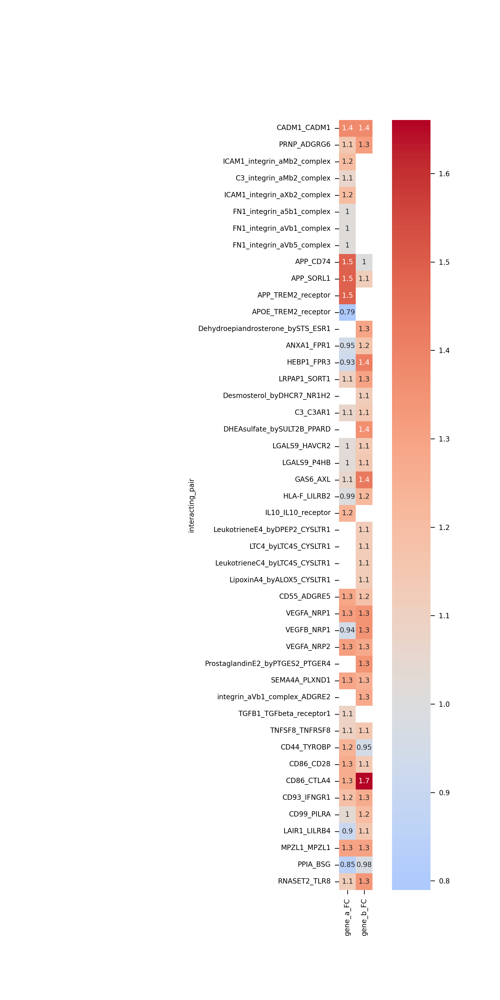

In [67]:
plt.figure(figsize=(10,20))
sns.heatmap(df_plot[['gene_a_FC', 'gene_b_FC']], cmap='coolwarm', center=1, annot=True, square=True)

<Axes: ylabel='interacting_pair'>

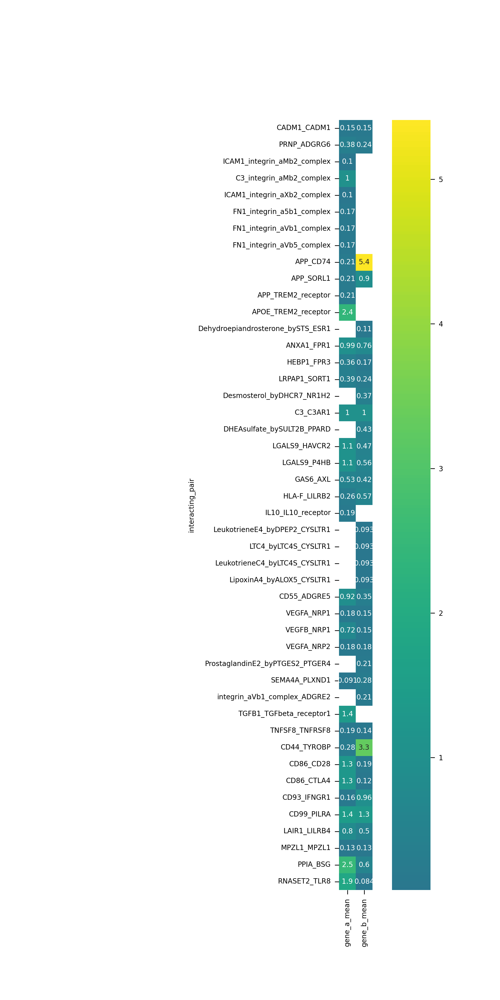

In [73]:
plt.figure(figsize=(10,20))
sns.heatmap(df_plot[['gene_a_mean', 'gene_b_mean']], cmap='viridis', center=1, annot=True, square=True)

In [76]:
df_plot.query('gene_a_mean > 0.2 & gene_b_mean > 0.2').index

Index(['PRNP_ADGRG6', 'APP_CD74', 'APP_SORL1', 'ANXA1_FPR1', 'LRPAP1_SORT1',
       'C3_C3AR1', 'LGALS9_HAVCR2', 'LGALS9_P4HB', 'GAS6_AXL', 'HLA-F_LILRB2',
       'CD55_ADGRE5', 'CD44_TYROBP', 'CD99_PILRA', 'LAIR1_LILRB4', 'PPIA_BSG'],
      dtype='object', name='interacting_pair')

In [53]:
df_plot

,id_cp_interaction,partner_a,partner_b,gene_a,gene_b,secreted,receptor_a,receptor_b,annotation_strategy,is_integrin,...,pDC|CD4 Tnaive,pDC|CD8 Tem_emra,pDC|CSF Mac,pDC|Cycling Myeloid,pDC|NK CD16,pDC|NK CD56,pDC|Treg,pDC|cDC1,pDC|cDC2,pDC|pDC
interacting_pair,,,,,,,,,,,,,,,,,,,,,
CADM1_CADM1,CPI-SS0889E281D,simple:Q9BY67,simple:Q9BY67,CADM1,CADM1,False,False,False,curated,False,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
PRNP_ADGRG6,CPI-SS0087B834D,simple:F7VJQ1,simple:Q86SQ4,PRNP,ADGRG6,False,False,True,curated,False,...,1.000,1.000,0.000,0.960,1.000,1.000,1.000,0.000,0.996,1.000
ICAM1_integrin_aMb2_complex,CPI-SC0C09120F1,simple:P05362,complex:integrin_aMb2_complex,ICAM1,NaN,False,True,False,curated,True,...,1.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,1.000
C3_integrin_aMb2_complex,CPI-SC0C93C7670,simple:P01024,complex:integrin_aMb2_complex,C3,NaN,True,False,False,curated,True,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
ICAM1_integrin_aXb2_complex,CPI-SC08CB03AD8,simple:P05362,complex:integrin_aXb2_complex,ICAM1,NaN,False,True,False,curated,True,...,1.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000
FN1_integrin_a5b1_complex,CPI-SC06C3BA86F,simple:P02751,complex:integrin_a5b1_complex,FN1,NaN,True,False,False,curated,True,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
FN1_integrin_aVb1_complex,CPI-SC08F923F07,simple:P02751,complex:integrin_aVb1_complex,FN1,NaN,True,False,False,curated,True,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
FN1_integrin_aVb5_complex,CPI-SC09B45FB39,simple:P02751,complex:integrin_aVb5_complex,FN1,NaN,True,False,False,curated,True,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000
APP_CD74,CPI-SS080C81D37,simple:P05067,simple:P04233,APP,CD74,False,False,True,curated,False,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [34]:
ser_FC_oi_a_per.loc[[x for x in list_gene_a if x in ser_FC_oi_a_per.index]].sort_values()

APP        0.019880
CADM1      0.082530
VEGFA      0.179066
MPZL1      0.203916
CD55       0.221687
CD86       0.267018
CD44       0.308133
IL10       0.312199
CD93       0.424398
PRNP       0.492319
RNASET2    0.562952
LRPAP1     0.593825
TNFSF8     0.615663
TGFB1      0.619428
C3         0.659639
GAS6       0.674849
CD99       0.727259
LGALS9     0.750904
FN1        0.778464
HLA-F      0.819277
ANXA1      0.903464
VEGFB      0.911145
HEBP1      0.936446
LAIR1      0.965663
PPIA       0.991867
APOE       0.995934
Name: CSF Mac, dtype: float64

In [35]:
ser_FC_oi_b_per.loc[[x for x in list_gene_b if x in ser_FC_oi_b_per.index]].sort_values()

CTLA4      0.006175
AXL        0.042018
FPR3       0.057229
CADM1      0.082530
PPARD      0.105572
NRP1       0.123795
PTGER4     0.125602
ADGRG6     0.173042
SORT1      0.198494
MPZL1      0.203916
ESR1       0.214006
NRP2       0.238102
ADGRE2     0.240211
IFNGR1     0.255572
PLXND1     0.286898
LILRB2     0.346687
PILRA      0.382982
ADGRE5     0.437801
FPR1       0.461295
P4HB       0.495030
LILRB4     0.495181
TNFRSF8    0.504970
C3AR1      0.511446
HAVCR2     0.515512
CD28       0.522139
SORL1      0.554819
NR1H2      0.560090
CD74       0.792771
BSG        0.845482
TYROBP     0.899096
Name: CSF Mac, dtype: float64

In [31]:
df_FC

,CD4 Tcm,CSF Mac,cDC2,CD8 Tem_emra,Cycling Myeloid,CD4 Tem,CD14 Mono,CD4 Tnaive,Treg,pDC,B memory,NK CD56,migDC,cDC1,Fibroblast,Cycling T,B naive,ASC,NK CD16,CD16 Mono
ENSG00000238009,0.994437,1.352757,1.856876,1.372740,0.000000,0.759733,5.257914,0.946802,inf,inf,0.860811,inf,NaN,inf,NaN,inf,NaN,NaN,inf,NaN
ENSG00000241860,1.593556,1.335905,1.971191,1.004119,inf,0.620128,0.998108,0.911840,2.266377,0.161051,inf,inf,NaN,1.202032,NaN,NaN,NaN,NaN,inf,inf
ENSG00000286448,1.364303,4.266280,0.174162,0.882603,NaN,inf,inf,0.284244,0.000000,inf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ENSG00000290385,1.534849,1.326901,1.146255,1.343688,0.528959,1.929268,1.287488,0.593021,0.517327,2.152582,NaN,1.195832,NaN,0.804516,NaN,NaN,NaN,NaN,inf,inf
ENSG00000291215,0.894006,0.884931,1.392014,0.877351,0.736522,0.919703,0.993982,1.068952,0.789602,1.195112,0.537661,1.151076,0.417085,0.555791,2.489806,0.195699,inf,inf,inf,1.056505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000273748,1.735866,1.827927,1.413715,1.263613,2.671368,1.236265,1.325334,1.910139,1.967992,1.279994,3.141817,1.780400,1.067621,1.716917,2.100451,2.253013,inf,inf,12.729336,2.160277
ENSG00000271254,1.140380,1.139795,1.165665,0.924696,1.070019,0.658599,0.728162,1.507917,1.487575,0.882275,inf,1.832143,NaN,1.213873,10.567846,inf,inf,NaN,0.490530,0.692124
ENSG00000276345,0.243623,0.285085,0.302330,0.318004,0.347692,0.326412,0.238189,0.358535,0.302023,0.238137,0.469138,0.353669,inf,0.290573,0.901218,0.567897,NaN,inf,0.371173,1.885600
ENSG00000276017,0.000000,2.349148,0.211809,0.000000,inf,NaN,1.701495,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,inf


In [33]:
df_FC['CSF Mac'].min()

0.0

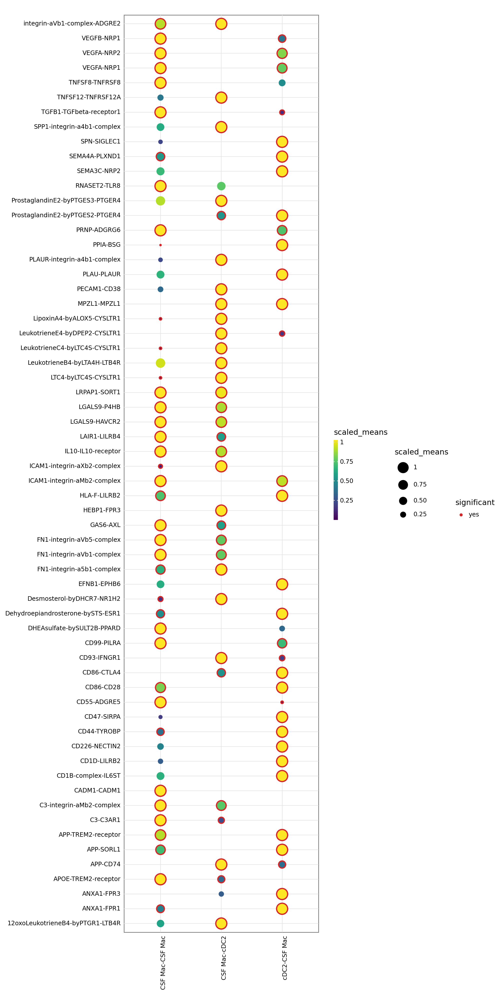

<Figure Size: (1000 x 2000)>

In [46]:
kpy.plot_cpdb(
    adata=adata,
    cell_type1="CSF Mac",
    cell_type2="CSF Mac|cDC2",
    means=means,
    pvals=pvals,
    celltype_key="cluster_L2",
    # gene_family="chemokines",
    highlight_size=1,
    figsize=(10, 20),
)

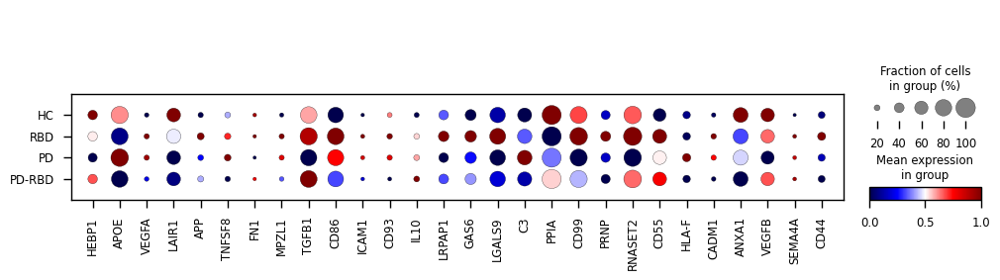

In [20]:
sc.pl.dotplot(adata[adata.obs['cluster_L2']==pair.split('|')[1]], list_gene_a, groupby=category_comp, standard_scale='var',
    cmap='seismic', save=False, categories_order=['HC', 'RBD', 'PD', 'PD-RBD'])

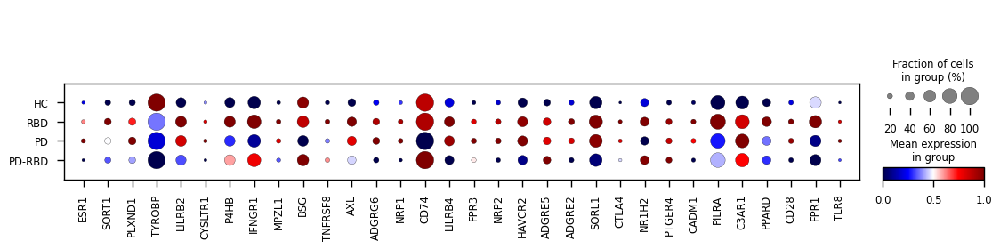

In [19]:
sc.pl.dotplot(adata[adata.obs['cluster_L2']==pair.split('|')[1]], list_gene_b, groupby=category_comp, standard_scale='var',
    cmap='seismic', save=False, categories_order=['HC', 'RBD', 'PD', 'PD-RBD'])

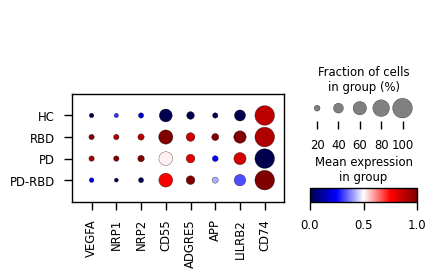

In [ ]:
sc.pl.dotplot(adata[adata.obs['cluster_L2']=='CSF Mac'], 
    ['VEGFA', 'NRP1', 'NRP2',
    'CD55', 'ADGRE5',
    'APP', 'LILRB2', 'CD74'],
    groupby='EnrollmentCategory', standard_scale='var',
    cmap='seismic', save=False, categories_order=['HC', 'RBD', 'PD', 'PD-RBD'])

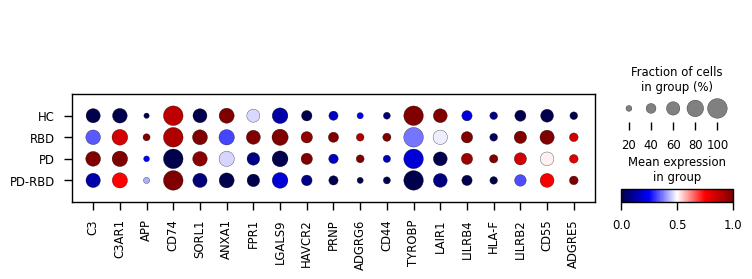

In [18]:
sc.pl.dotplot(adata[adata.obs['cluster_L2']=='CSF Mac'], 
['C3', 'C3AR1',
'APP', 'CD74', 'SORL1',
'ANXA1', 'FPR1',
'LGALS9', 'HAVCR2',
'PRNP', 'ADGRG6',
'CD44', 'TYROBP',
'LAIR1', 'LILRB4',
'HLA-F', 'LILRB2',
'CD55', 'ADGRE5'
],
groupby='EnrollmentCategory', standard_scale='var',
    cmap='seismic', save=False, categories_order=['HC', 'RBD', 'PD', 'PD-RBD'])

In [13]:
# pair = 'CD4 Tem|ASC'
pair = 'CSF Mac|CSF Mac'
list_gene_a = list(set(pvals.loc[pvals[pair] < th_alpha, 'gene_a'].dropna()))
list_gene_b = list(set(pvals.loc[pvals[pair] < th_alpha, 'gene_b'].dropna()))
ser_FC_oi_a = df_FC.loc[df_mean[pair.split('|')[0]] > th_mean, pair.split('|')[0]].dropna()
ser_FC_oi_b = df_FC.loc[df_mean[pair.split('|')[1]] > th_mean, pair.split('|')[1]].dropna()
ser_FC_oi_a = ser_FC_oi_a[ser_FC_oi_a != np.inf]
ser_FC_oi_b = ser_FC_oi_b[ser_FC_oi_b != np.inf]
ser_FC_oi_a = ser_FC_oi_a[ser_FC_oi_a != 0]
ser_FC_oi_b = ser_FC_oi_b[ser_FC_oi_b != 0]
ser_FC_oi_a_per = ser_FC_oi_a.rank(ascending=False) / ser_FC_oi_a.shape[0]
ser_FC_oi_b_per = ser_FC_oi_b.rank(ascending=False) / ser_FC_oi_b.shape[0]


In [14]:
df_plot = pvals.loc[pvals[pair] < th_alpha]
df_plot.set_index('interacting_pair', inplace=True)

list_fc = []
list_mean = []
for g in df_plot['gene_a']:
    if str(g) == 'nan':
        list_fc.append(np.nan)
        list_mean.append(np.nan)
    else:
        list_fc.append(df_FC['CSF Mac'].loc[g])
        list_mean.append(df_mean['CSF Mac'].loc[g])
df_plot['gene_a_FC'] = list_fc
df_plot['gene_a_mean'] = list_mean

list_fc = []
list_mean = []
for g in df_plot['gene_b']:
    if str(g) == 'nan':
        list_fc.append(np.nan)
        list_mean.append(np.nan)
    else:
        list_fc.append(df_FC['CSF Mac'].loc[g])
        list_mean.append(df_mean['CSF Mac'].loc[g])
df_plot['gene_b_FC'] = list_fc
df_plot['gene_b_mean'] = list_mean

/tmp/ipykernel_3282263/2026397551.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_3282263/2026397551.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_3282263/2026397551.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykerne

In [15]:
list_lr_plot = ['C3_C3AR1', 'CD55_ADGRE5', 'LGALS9_HAVCR2', 'APP_CD74', 'APP_SORL1', 'HLA-F_LILRB2', 'PRNP_ADGRG6']

In [19]:
pvals.set_index('interacting_pair', inplace=True)

/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/4287442044.py:17: RuntimeWarning: divide b

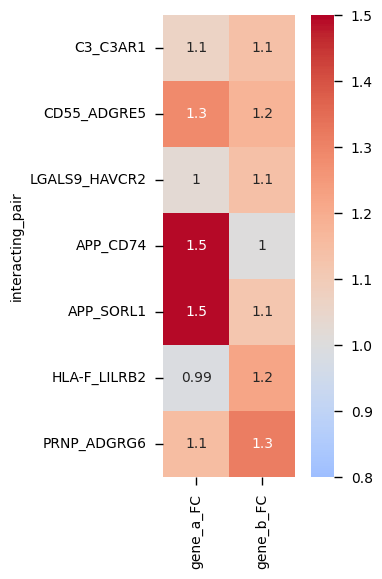

In [26]:
th_alpha = 0.05
th_mean = 0.1
# category_comp = 'Diagnosis_RBDstrat'
category_comp = 'EnrollmentCategory'
cat_ref = 'HC'
# cat_oi = 'RBD_Hyposmia_neg'
cat_oi = 'RBD'


list_all_gene = list(set(list(means['gene_a'].dropna()) + list(means['gene_b'].dropna())))
pairs = list(pvals.columns)[13:]

list_d_FC = []
list_d_mean = []
for clu in list(adata.obs['cluster_L2'].unique()):
    d_FC = pd.DataFrame(
        np.expm1(adata[(adata.obs[category_comp] == cat_oi)&(adata.obs['cluster_L2']==clu)].X.mean(axis=0)) / \
            np.expm1(adata[(adata.obs[category_comp] == cat_ref)&(adata.obs['cluster_L2']==clu)].X.mean(axis=0)),
            columns=adata.var.index, index=[clu]).T
    d_mean = pd.DataFrame(
        adata[adata.obs['cluster_L2']==clu].X.mean(axis=0),
            columns=adata.var.index, index=[clu]).T
    list_d_FC.append(d_FC)
    list_d_mean.append(d_mean)

df_FC = pd.concat(list_d_FC, axis=1)
df_mean = pd.concat(list_d_mean, axis=1)

# df_plot = pvals.set_index('interacting_pair', inplace=True).loc[list_lr_plot]
df_plot = pvals.loc[list_lr_plot]

list_fc = []
list_mean = []
for g in df_plot['gene_a']:
    if str(g) == 'nan':
        list_fc.append(np.nan)
        list_mean.append(np.nan)
    else:
        list_fc.append(df_FC['CSF Mac'].loc[g])
        list_mean.append(df_mean['CSF Mac'].loc[g])
df_plot['gene_a_FC'] = list_fc
df_plot['gene_a_mean'] = list_mean

list_fc = []
list_mean = []
for g in df_plot['gene_b']:
    if str(g) == 'nan':
        list_fc.append(np.nan)
        list_mean.append(np.nan)
    else:
        list_fc.append(df_FC['CSF Mac'].loc[g])
        list_mean.append(df_mean['CSF Mac'].loc[g])
df_plot['gene_b_FC'] = list_fc
df_plot['gene_b_mean'] = list_mean

plt.figure(figsize=(4,6))
sns.heatmap(df_plot[['gene_a_FC', 'gene_b_FC']], cmap='coolwarm', center=1, annot=True, square=True, vmax=1.5, vmin=0.8)
plt.savefig('../scanpy/{}/graph/selected_LR_CSFMac_CSFMac_RBD.pdf'.format(version))

/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: invalid value encountered in divide


/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/3509668133.py:17: RuntimeWarning: divide b

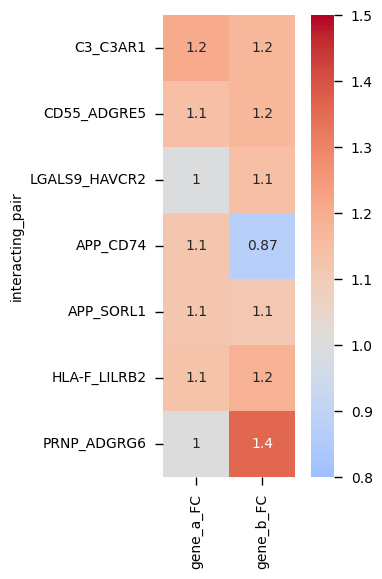

In [25]:
th_alpha = 0.05
th_mean = 0.1
# category_comp = 'Diagnosis_RBDstrat'
category_comp = 'EnrollmentCategory'
cat_ref = 'HC'
# cat_oi = 'RBD_Hyposmia_neg'
cat_oi = 'PD'


list_all_gene = list(set(list(means['gene_a'].dropna()) + list(means['gene_b'].dropna())))
pairs = list(pvals.columns)[13:]

list_d_FC = []
list_d_mean = []
for clu in list(adata.obs['cluster_L2'].unique()):
    d_FC = pd.DataFrame(
        np.expm1(adata[(adata.obs[category_comp] == cat_oi)&(adata.obs['cluster_L2']==clu)].X.mean(axis=0)) / \
            np.expm1(adata[(adata.obs[category_comp] == cat_ref)&(adata.obs['cluster_L2']==clu)].X.mean(axis=0)),
            columns=adata.var.index, index=[clu]).T
    d_mean = pd.DataFrame(
        adata[adata.obs['cluster_L2']==clu].X.mean(axis=0),
            columns=adata.var.index, index=[clu]).T
    list_d_FC.append(d_FC)
    list_d_mean.append(d_mean)

df_FC = pd.concat(list_d_FC, axis=1)
df_mean = pd.concat(list_d_mean, axis=1)

# df_plot = pvals.set_index('interacting_pair', inplace=True).loc[list_lr_plot]
df_plot = pvals.loc[list_lr_plot]

list_fc = []
list_mean = []
for g in df_plot['gene_a']:
    if str(g) == 'nan':
        list_fc.append(np.nan)
        list_mean.append(np.nan)
    else:
        list_fc.append(df_FC['CSF Mac'].loc[g])
        list_mean.append(df_mean['CSF Mac'].loc[g])
df_plot['gene_a_FC'] = list_fc
df_plot['gene_a_mean'] = list_mean

list_fc = []
list_mean = []
for g in df_plot['gene_b']:
    if str(g) == 'nan':
        list_fc.append(np.nan)
        list_mean.append(np.nan)
    else:
        list_fc.append(df_FC['CSF Mac'].loc[g])
        list_mean.append(df_mean['CSF Mac'].loc[g])
df_plot['gene_b_FC'] = list_fc
df_plot['gene_b_mean'] = list_mean

plt.figure(figsize=(4,6))
sns.heatmap(df_plot[['gene_a_FC', 'gene_b_FC']], cmap='coolwarm', center=1, annot=True, square=True, vmax=1.5, vmin=0.8)
plt.savefig('../scanpy/{}/graph/selected_LR_CSFMac_CSFMac_PD.pdf'.format(version))

/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: invalid value encountered in divide


/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: divide by zero encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_3282263/2254272724.py:17: RuntimeWarning: divide b

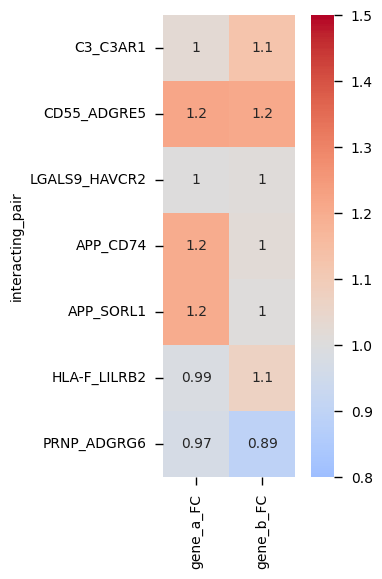

In [25]:
th_alpha = 0.05
th_mean = 0.1
# category_comp = 'Diagnosis_RBDstrat'
category_comp = 'EnrollmentCategory'
cat_ref = 'HC'
# cat_oi = 'RBD_Hyposmia_neg'
cat_oi = 'PD-RBD'


list_all_gene = list(set(list(means['gene_a'].dropna()) + list(means['gene_b'].dropna())))
pairs = list(pvals.columns)[13:]

list_d_FC = []
list_d_mean = []
for clu in list(adata.obs['cluster_L2'].unique()):
    d_FC = pd.DataFrame(
        np.expm1(adata[(adata.obs[category_comp] == cat_oi)&(adata.obs['cluster_L2']==clu)].X.mean(axis=0)) / \
            np.expm1(adata[(adata.obs[category_comp] == cat_ref)&(adata.obs['cluster_L2']==clu)].X.mean(axis=0)),
            columns=adata.var.index, index=[clu]).T
    d_mean = pd.DataFrame(
        adata[adata.obs['cluster_L2']==clu].X.mean(axis=0),
            columns=adata.var.index, index=[clu]).T
    list_d_FC.append(d_FC)
    list_d_mean.append(d_mean)

df_FC = pd.concat(list_d_FC, axis=1)
df_mean = pd.concat(list_d_mean, axis=1)

# df_plot = pvals.set_index('interacting_pair', inplace=True).loc[list_lr_plot]
df_plot = pvals.loc[list_lr_plot]

list_fc = []
list_mean = []
for g in df_plot['gene_a']:
    if str(g) == 'nan':
        list_fc.append(np.nan)
        list_mean.append(np.nan)
    else:
        list_fc.append(df_FC['CSF Mac'].loc[g])
        list_mean.append(df_mean['CSF Mac'].loc[g])
df_plot['gene_a_FC'] = list_fc
df_plot['gene_a_mean'] = list_mean

list_fc = []
list_mean = []
for g in df_plot['gene_b']:
    if str(g) == 'nan':
        list_fc.append(np.nan)
        list_mean.append(np.nan)
    else:
        list_fc.append(df_FC['CSF Mac'].loc[g])
        list_mean.append(df_mean['CSF Mac'].loc[g])
df_plot['gene_b_FC'] = list_fc
df_plot['gene_b_mean'] = list_mean

plt.figure(figsize=(4,6))
sns.heatmap(df_plot[['gene_a_FC', 'gene_b_FC']], cmap='coolwarm', center=1, annot=True, square=True, vmax=1.5, vmin=0.8)
plt.savefig('../scanpy/{}/graph/selected_LR_CSFMac_CSFMac_PDRBD.pdf'.format(version))